In [56]:
import os

import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns

from scipy.stats import skew

from sklearn.model_selection import KFold, cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.base import clone

from sklearn.kernel_ridge import KernelRidge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
import xgboost as xgb
from sklearn.ensemble import VotingRegressor

from sklearn.metrics import mean_squared_error

In [97]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
def score_outliers(data, perc1=25, perc3=75):
    q1 = np.percentile(data, perc1)
    q3 = np.percentile(data, perc3)
    iqr = q3 - q1
    outlier_low = q1 - 1.5*iqr
    outlier_high = q3 + 1.5*iqr
    return q1, q3, iqr, outlier_low, outlier_high

In [3]:
def error_metric_cv(model, X, y, scoring="neg_mean_squared_error", n_cv=5):
    kf = KFold(n_cv, shuffle=True).get_n_splits(X)
    rmse = cross_val_score(model, X, y, scoring=scoring, cv = kf)
    return rmse

In [5]:
def neg_error_metric_cv(model, X, y, scoring="neg_mean_squared_error", n_cv=5):
    return -error_metric_cv(model, X, y, scoring=scoring, n_cv=n_cv)

In [6]:
def models_cv_stat(models, X, y, scoring="neg_mean_squared_error", n_cv=5):
    stat_df = pd.DataFrame()
    stat_df['model'] = list(models.keys())
    scores = np.array([cross_val_score(m, X, y, cv=n_cv) for m in models.values()])
    stat_df['cv_score_mean'] = scores.mean(axis=-1)
    stat_df['cv_score_std'] = scores.std(axis=-1)
    scores = np.array([neg_error_metric_cv(m, X, y, scoring="neg_mean_squared_error", n_cv=n_cv) for m in models.values()])
    stat_df['rmsle_cv_score_mean'] = scores.mean(axis=-1)
    stat_df['rmsle_cv_score_std'] = scores.std(axis=-1)
    return stat_df

In [7]:
def models_pred_stat(models, X_train, y_train, X_test, y_test):
    stat_df = pd.DataFrame()
    stat_df['model'] = list(models.keys())
    for Xy_type, X, y in zip(['train', 'test'], [X_train, X_test], [y_train, y_test]):
        y_preds = [m.predict(X) for m in models.values()]
        stat_df['rmse_{}'.format(Xy_type)] = [
            np.sqrt(mean_squared_error(np.array(y), y_pred))
            for y_pred in y_preds
        ]
    return stat_df

# Reading src data

In [8]:
src_catalog = './house-prices-advanced-regression-techniques'

### train

In [9]:
train_file = os.path.join(src_catalog, 'train.csv')

In [10]:
train_df = pd.read_csv(train_file, sep=',')
train_df.shape

(1460, 81)

In [11]:
train_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [12]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [13]:
train_ids = list(train_df['Id'])
len(train_ids)

1460

<AxesSubplot:>

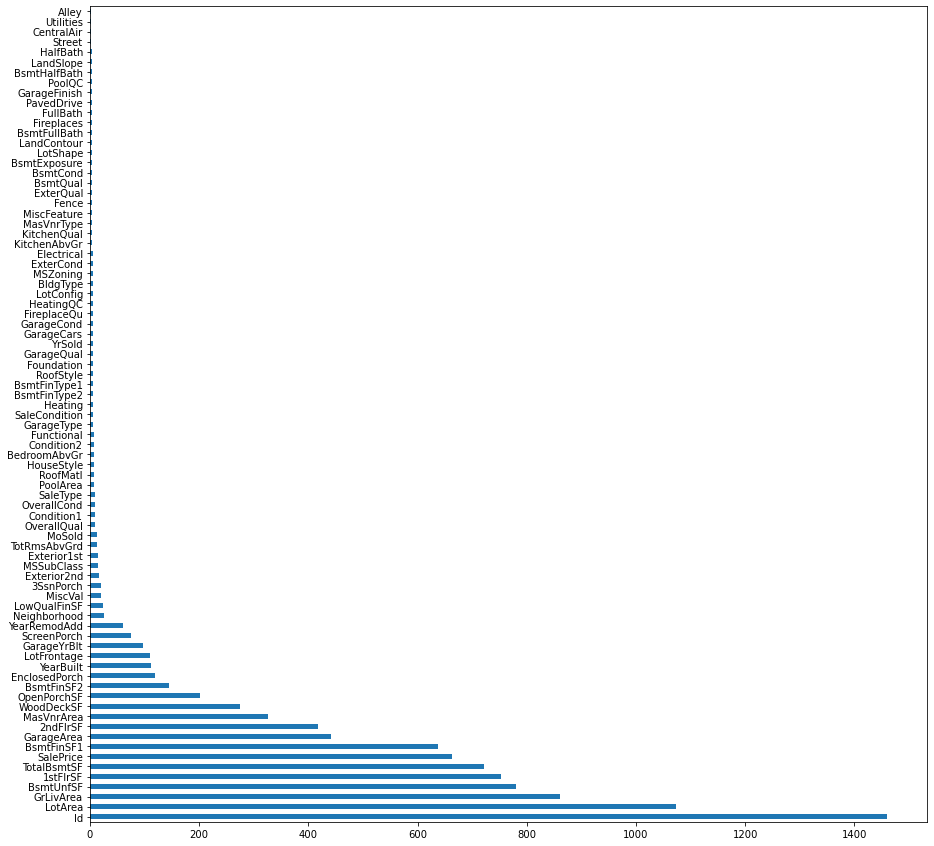

In [14]:
plt.figure(figsize=(15,15))
nunique_train_cols_s = train_df.nunique()
nunique_train_cols_s.sort_values(ascending=False).plot.barh()

In [15]:
not_cat_cols = [
    'Id',
    'LotFrontage',
    'LotArea',
    'MasVnrArea',
    'BsmtFinSF1',
    'BsmtFinSF2',
    'BsmtUnfSF', 
    'TotalBsmtSF',
    '1stFlrSF',
    '2ndFlrSF',
    'LowQualFinSF',
    'GrLivArea',
    'GarageArea',
    'WoodDeckSF',
    'OpenPorchSF',
    'EnclosedPorch',
    '3SsnPorch',
    'ScreenPorch',
    'PoolArea',
    'MiscVal',
    'SalePrice',
]
len(not_cat_cols)

21

In [16]:
plot_cols = list(train_df.columns.copy())
for col in not_cat_cols:
    plot_cols.remove(col)
len(plot_cols)

60

In [17]:
plot_cols[:5]

['MSSubClass', 'MSZoning', 'Street', 'Alley', 'LotShape']

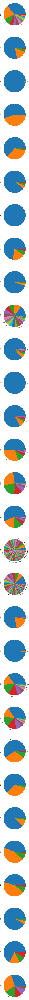

In [18]:
n_start = 0
n_stop = int(len(plot_cols) / 2)
fig, axes = plt.subplots(len(plot_cols[n_start:n_stop]), 1, figsize=(15,15 * (n_stop - n_start)))
for i, col in enumerate(plot_cols[n_start:n_stop]):
    train_df[col].value_counts().plot.pie(ax=axes[i])

<AxesSubplot:>

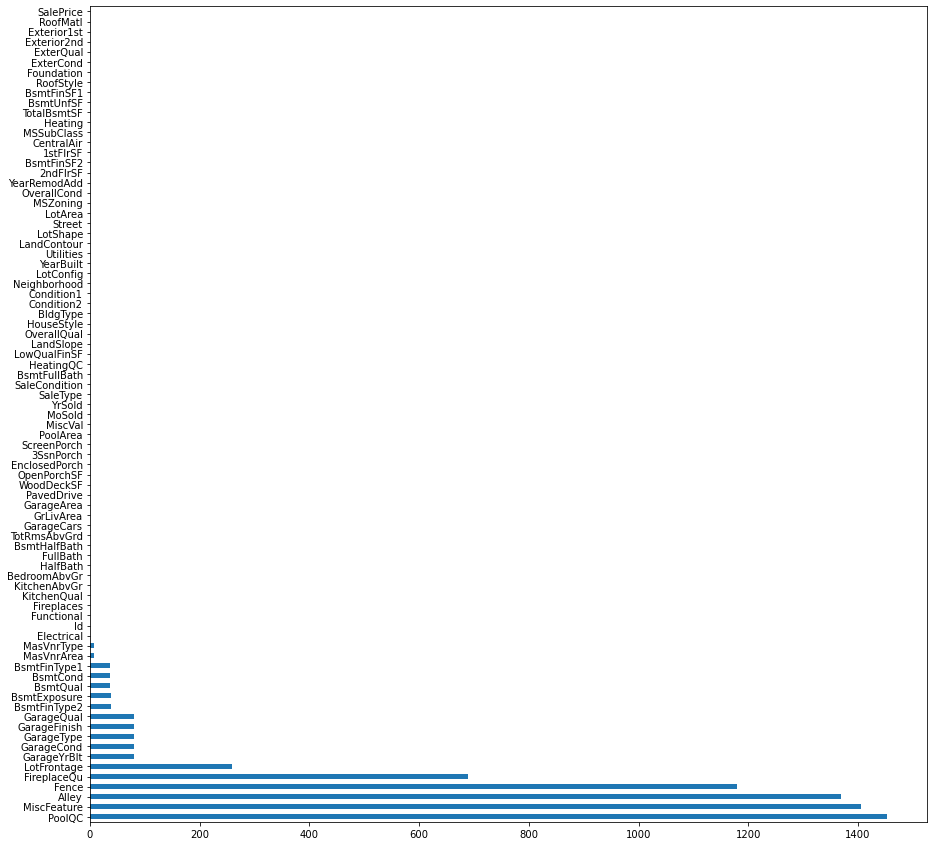

In [19]:
plt.figure(figsize=(15,15))
is_null_train_cols_s = train_df.isnull().sum()
is_null_train_cols_s.sort_values(ascending=False).plot.barh(x='cols', y='null_cnt')

In [20]:
not_null_train_cols = list(is_null_train_cols_s[is_null_train_cols_s == 0].index)
not_null_train_cols[:5]

['Id', 'MSSubClass', 'MSZoning', 'LotArea', 'Street']

In [21]:
len(not_null_train_cols)

62

In [22]:
null_train_cols = list(is_null_train_cols_s[is_null_train_cols_s != 0].sort_values(ascending=True).index)
null_train_cols[:5]

['Electrical', 'MasVnrType', 'MasVnrArea', 'BsmtQual', 'BsmtCond']

In [23]:
len(null_train_cols)

19

In [24]:
is_null_train_cols_s[null_train_cols]

Electrical         1
MasVnrType         8
MasVnrArea         8
BsmtQual          37
BsmtCond          37
BsmtFinType1      37
BsmtExposure      38
BsmtFinType2      38
GarageCond        81
GarageQual        81
GarageFinish      81
GarageType        81
GarageYrBlt       81
LotFrontage      259
FireplaceQu      690
Fence           1179
Alley           1369
MiscFeature     1406
PoolQC          1453
dtype: int64

### test

In [25]:
test_file = os.path.join(src_catalog, 'test.csv')

In [26]:
test_df = pd.read_csv(test_file, sep=',')
test_df.shape

(1459, 80)

In [27]:
test_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,...,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,...,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


In [28]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1459 non-null   int64  
 1   MSSubClass     1459 non-null   int64  
 2   MSZoning       1455 non-null   object 
 3   LotFrontage    1232 non-null   float64
 4   LotArea        1459 non-null   int64  
 5   Street         1459 non-null   object 
 6   Alley          107 non-null    object 
 7   LotShape       1459 non-null   object 
 8   LandContour    1459 non-null   object 
 9   Utilities      1457 non-null   object 
 10  LotConfig      1459 non-null   object 
 11  LandSlope      1459 non-null   object 
 12  Neighborhood   1459 non-null   object 
 13  Condition1     1459 non-null   object 
 14  Condition2     1459 non-null   object 
 15  BldgType       1459 non-null   object 
 16  HouseStyle     1459 non-null   object 
 17  OverallQual    1459 non-null   int64  
 18  OverallC

In [29]:
test_ids = list(test_df['Id'])
len(test_ids)

1459

<AxesSubplot:>

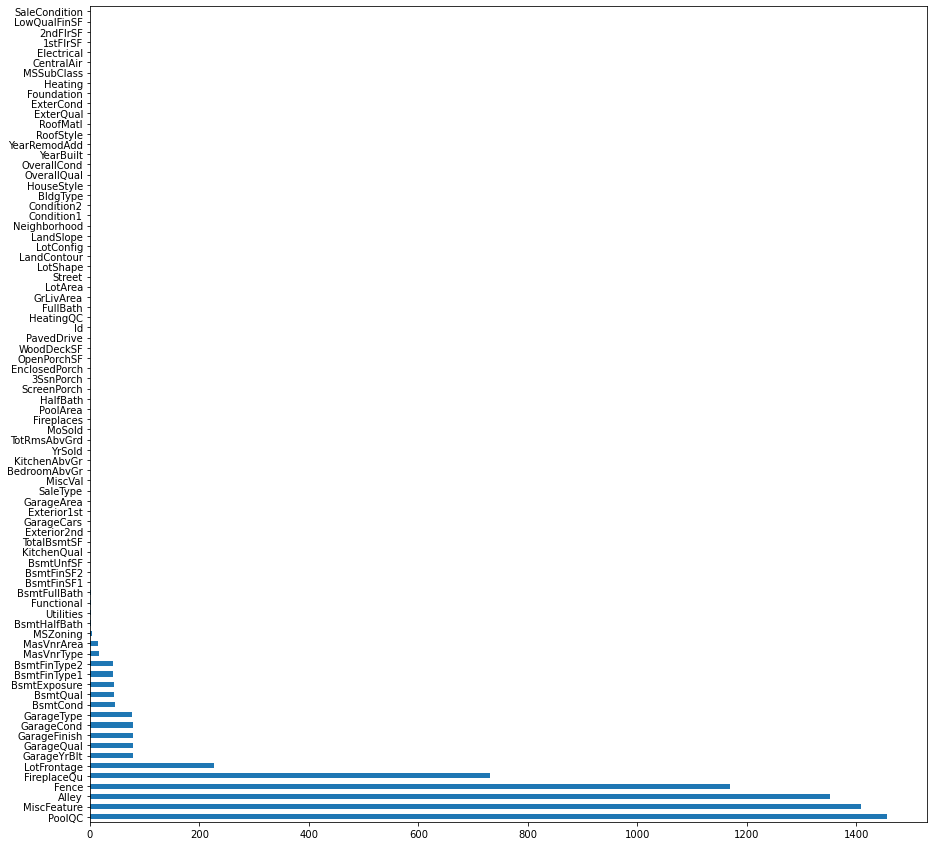

In [30]:
plt.figure(figsize=(15,15))
is_null_test_cols_s = test_df.isnull().sum()
is_null_test_cols_s.sort_values(ascending=False).plot.barh(x='cols', y='null_cnt')

In [31]:
not_null_test_cols = list(is_null_test_cols_s[is_null_test_cols_s == 0].index)
not_null_test_cols[:5]

['Id', 'MSSubClass', 'LotArea', 'Street', 'LotShape']

In [32]:
len(not_null_test_cols)

47

In [33]:
null_test_cols = list(is_null_test_cols_s[is_null_test_cols_s != 0].sort_values(ascending=True).index)
null_test_cols[:5]

['TotalBsmtSF', 'GarageArea', 'GarageCars', 'KitchenQual', 'BsmtUnfSF']

In [34]:
len(null_test_cols)

33

In [35]:
is_null_test_cols_s[null_test_cols]

TotalBsmtSF        1
GarageArea         1
GarageCars         1
KitchenQual        1
BsmtUnfSF          1
BsmtFinSF2         1
BsmtFinSF1         1
SaleType           1
Exterior1st        1
Exterior2nd        1
Functional         2
Utilities          2
BsmtHalfBath       2
BsmtFullBath       2
MSZoning           4
MasVnrArea        15
MasVnrType        16
BsmtFinType2      42
BsmtFinType1      42
BsmtQual          44
BsmtExposure      44
BsmtCond          45
GarageType        76
GarageFinish      78
GarageQual        78
GarageCond        78
GarageYrBlt       78
LotFrontage      227
FireplaceQu      730
Fence           1169
Alley           1352
MiscFeature     1408
PoolQC          1456
dtype: int64

# Analizing train data

### SalePrice

In [36]:
train_df['SalePrice'].describe()

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64

<AxesSubplot:>

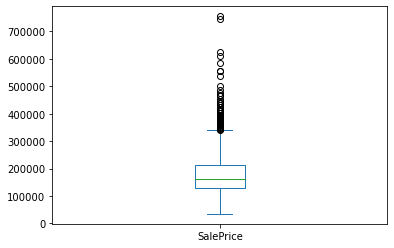

In [37]:
train_df['SalePrice'].plot.box()

<AxesSubplot:xlabel='SalePrice', ylabel='Count'>

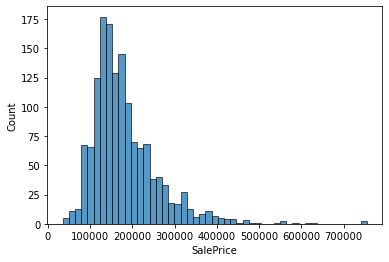

In [38]:
sns.histplot(train_df['SalePrice'])

# Filling null values

In [39]:
data_df = pd.concat([train_df, test_df], ignore_index=True)
data_df.pop('SalePrice')
data_df.shape

(2919, 80)

### NA values

In [40]:
na_cols = [
    'Alley',
    'BsmtQual',
    'BsmtCond',
    'BsmtExposure',
    'BsmtFinType1', 
    'BsmtFinType2', 
    'FireplaceQu', 
    'GarageType', 
    'GarageFinish', 
    'GarageQual',
    'GarageCond',
    'PoolQC',
    'Fence',
    'MiscFeature'
]

In [41]:
for col in na_cols:
    data_df[col].fillna('NA', inplace=True)

### Mode values

In [42]:
mode_cols = [
    'MSZoning',
    'Utilities',
    'Electrical',
    'SaleType',
    'KitchenQual',
    'Exterior1st',
    'Exterior2nd'
]

In [43]:
for col in mode_cols:
    data_df[col].fillna(data_df[col].mode()[0], inplace=True)

### Zero values

In [44]:
zero_cols = [
    'BsmtFinSF1',
    'BsmtFinSF2',
    'BsmtUnfSF',
    'TotalBsmtSF',
    'BsmtFullBath',
    'BsmtHalfBath',
    'GarageCars',
    'GarageArea',    
    'YearBuilt',
    'YearRemodAdd',
    'GarageYrBlt',
    'MoSold',
    'YrSold'
]

In [45]:
for col in zero_cols:
    data_df[col].fillna(0, inplace=True)

### MasVnr values

In [46]:
data_df['MasVnrType'].fillna('None', inplace=True)
data_df['MasVnrArea'].fillna(0, inplace=True)

### Functional value

In [47]:
data_df['Functional'].fillna('Typ', inplace=True)

### Numerical categorial values

In [48]:
num_to_cat_cols = [
    'MSSubClass',
    'OverallQual',
    'OverallCond'
]

In [49]:
for col in num_to_cat_cols:
    data_df[col] = data_df[col].astype('str')

In [50]:
for col in num_to_cat_cols:
    data_df[col].fillna('NA', inplace=True)

### Correlation

In [51]:
data_corr = data_df.corr()
data_corr.shape

(34, 34)

<AxesSubplot:>

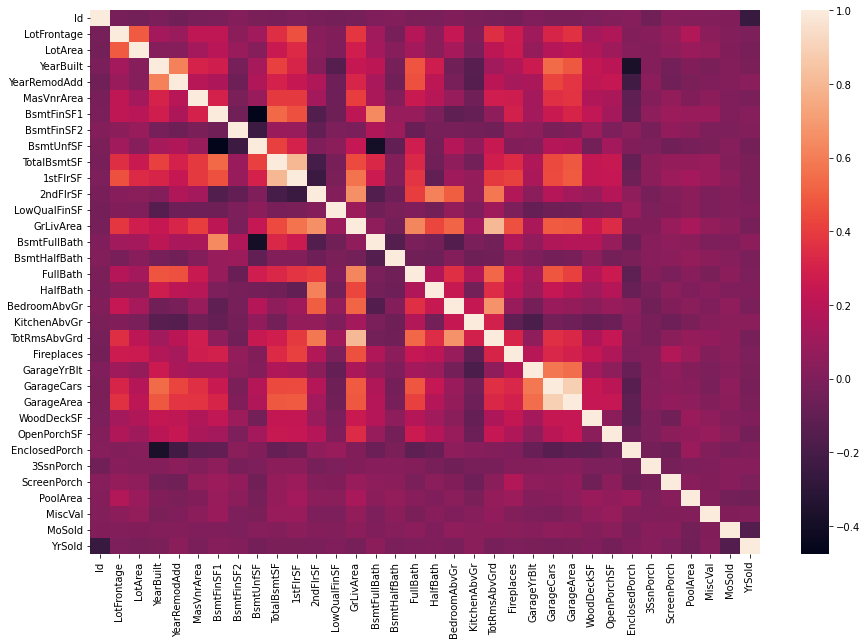

In [52]:
plt.subplots(figsize=(15,10))
sns.heatmap(data_corr)

### LotFrontage value

In [53]:
col='LotFrontage'

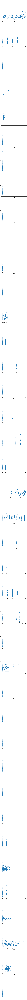

In [54]:
i1 = 0
i2 = int(len(data_df.columns) / 2)
fig, axes = plt.subplots(len(data_df.columns[i1:i2]), 1, figsize=(15,15*(i2-i1)))
for i, c in enumerate(data_df.columns[i1:i2]):
    data_df.get([c, col]).dropna().plot.scatter(x=c, y=col, ax=axes[i], rot=90)

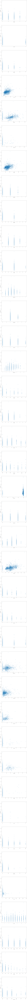

In [55]:
i1 = int(len(data_df.columns) / 2)
i2 = len(data_df.columns)
fig, axes = plt.subplots(len(data_df.columns[i1:i2]), 1, figsize=(15,15*(i2-i1)))
for i, c in enumerate(data_df.columns[i1:i2]):
    data_df.get([c, col]).dropna().plot.scatter(x=c, y=col, ax=axes[i], rot=90)

##### Skew

In [57]:
numeric_cols = data_df.dtypes[data_df.dtypes != "object"].index
skew_s = data_df[numeric_cols].apply(lambda x: skew(x.dropna())).sort_values(ascending=False)
skew_s

MiscVal          21.947195
PoolArea         16.898328
LotArea          12.822431
LowQualFinSF     12.088761
3SsnPorch        11.376065
KitchenAbvGr      4.302254
BsmtFinSF2        4.146143
EnclosedPorch     4.003891
ScreenPorch       3.946694
BsmtHalfBath      3.931594
MasVnrArea        2.613592
OpenPorchSF       2.535114
WoodDeckSF        1.842433
LotFrontage       1.502351
1stFlrSF          1.469604
BsmtFinSF1        1.425230
GrLivArea         1.269358
TotalBsmtSF       1.156894
BsmtUnfSF         0.919339
2ndFlrSF          0.861675
TotRmsAbvGrd      0.758367
Fireplaces        0.733495
HalfBath          0.694566
BsmtFullBath      0.624832
BedroomAbvGr      0.326324
GarageArea        0.239257
MoSold            0.195884
FullBath          0.167606
YrSold            0.132399
Id                0.000000
GarageCars       -0.219581
YearRemodAdd     -0.451020
YearBuilt        -0.599806
GarageYrBlt      -3.906205
dtype: float64

In [58]:
skew_cols = list(skew_s[abs(skew_s) >= 0.45].index)
len(skew_cols)

27

In [59]:
skew_cols[:5]

['MiscVal', 'PoolArea', 'LotArea', 'LowQualFinSF', '3SsnPorch']

In [60]:
data_log1p_df = data_df.copy()
for skew_col in skew_cols:
    data_log1p_df[skew_col] = np.log1p(data_log1p_df[skew_col])
data_log1p_df.shape

(2919, 80)

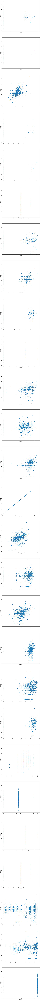

In [61]:
fig, axes = plt.subplots(len(skew_cols), 1, figsize=(15,15*len(skew_cols)))
for i, c in enumerate(skew_cols):
    data_log1p_df.get([c, col]).dropna().plot.scatter(x=c, y=col, ax=axes[i], rot=90)

##### Outliers

In [62]:
linear_cols = [
    'LotArea',
    'MasVnrArea',
    'BsmtFinSF1',
    'BsmtFinSF2',
    'BsmtUnfSF',
    'TotalBsmtSF',
    '1stFlrSF',
    '2ndFlrSF',
    'GrLivArea',
    'GarageArea',
    'WoodDeckSF',
    'OpenPorchSF'
]

In [63]:
linear_thresholds = dict()
for c in linear_cols + [col]:
    _, _, _, _, linear_thresholds[c] = score_outliers(train_df[c].dropna())
linear_thresholds[col]

111.5

In [64]:
data_thr_df = data_df.copy()
for c in linear_cols + [col]:
    data_thr_df = data_thr_df[data_thr_df[c] <= linear_thresholds[c]]
data_thr_df.shape

(1727, 80)

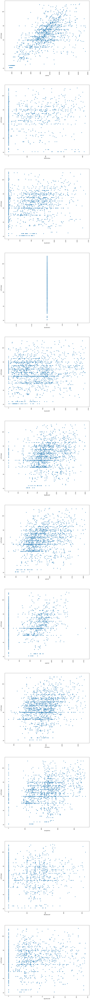

In [65]:
fig, axes = plt.subplots(len(linear_cols), 1, figsize=(15,15*len(linear_cols)))
for i, c in enumerate(linear_cols):
    data_thr_df.get([c, col]).dropna().plot.scatter(x=c, y=col, ax=axes[i], rot=90)

### Dummies

In [66]:
data_log1p_dummies_df = pd.get_dummies(data_log1p_df)
data_log1p_dummies_df.shape

(2919, 335)

In [67]:
data_log1p_thr_dummies_df = data_log1p_dummies_df[data_log1p_dummies_df['Id'].isin(data_thr_df['Id'])]
data_log1p_thr_dummies_df.shape

(1727, 335)

In [68]:
data_log1p_thr_dummies_df.head()

,Id,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,...,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,1,4.189655,9.042040,7.602900,7.602900,5.283204,6.561031,0.0,5.017280,6.753438,...,0,0,0,1,0,0,0,0,1,0
1,2,4.394449,9.169623,7.589336,7.589336,0.000000,6.886532,0.0,5.652489,7.141245,...,0,0,0,1,0,0,0,0,1,0
2,3,4.234107,9.328212,7.601902,7.602401,5.093750,6.188264,0.0,6.075346,6.825460,...,0,0,0,1,0,0,0,0,1,0
3,4,4.110874,9.164401,7.557995,7.586296,0.000000,5.379897,0.0,6.293419,6.629363,...,0,0,0,1,1,0,0,0,0,0
4,5,4.442651,9.565284,7.601402,7.601402,5.860786,6.486161,0.0,6.196444,7.044033,...,0,0,0,1,0,0,0,0,1,0


In [69]:
data_log1p_thr_dummies_train_df = data_log1p_thr_dummies_df[data_log1p_thr_dummies_df[col].notnull()]
data_log1p_thr_dummies_train_df.shape

(1727, 335)

### Regression

In [70]:
X = data_log1p_thr_dummies_train_df.copy()
X.pop(col)
X.pop('Id')
y = data_log1p_thr_dummies_train_df[col]
X.shape, y.shape

((1727, 333), (1727,))

In [71]:
X_train, X_validation, y_train, y_validation = train_test_split(X, y, train_size=0.75, random_state=42)
X_train.shape, X_validation.shape, y_train.shape, y_validation.shape

((1295, 333), (432, 333), (1295,), (432,))

##### Ridge

In [72]:
ridge_model = Pipeline(steps=[('robast', RobustScaler()), ('ridge', KernelRidge(kernel='polynomial'))])

In [102]:
param_grid = {
    'ridge__alpha': [1, 0.1, 0.01, 0.001],
    'ridge__degree': range(2, 6),
}

ridge_grid_search = GridSearchCV(ridge_model, param_grid=param_grid, scoring='neg_mean_squared_error')

In [103]:
ridge_grid_search.fit(X_train, y_train)

GridSearchCV(estimator=Pipeline(steps=[('robast', RobustScaler()),
                                       ('ridge',
                                        KernelRidge(alpha=0.1, degree=2,
                                                    kernel='polynomial'))]),
             param_grid={'ridge__alpha': [1, 0.1, 0.01, 0.001],
                         'ridge__degree': range(2, 6)},
             scoring='neg_mean_squared_error')

In [75]:
ridge_grid_search.best_params_

{'ridge__alpha': 0.1, 'ridge__degree': 2}

In [76]:
ridge_grid_search.best_score_

-0.022993947511038802

In [77]:
alpha = ridge_grid_search.best_params_['ridge__alpha']
degree = ridge_grid_search.best_params_['ridge__degree']

ridge_model = Pipeline(
    steps=[
        ('robast', RobustScaler()),
        ('ridge', KernelRidge(alpha=alpha, kernel='polynomial', degree=degree))
    ]
)
ridge_model

Pipeline(steps=[('robast', RobustScaler()),
                ('ridge',
                 KernelRidge(alpha=0.1, degree=2, kernel='polynomial'))])

##### Lasso

In [78]:
lasso_model = Pipeline(steps=[('robast', RobustScaler()), ('lasso', Lasso())])

In [79]:
param_grid = {
    'lasso__alpha': [1, 0.1, 0.01, 0.001],
}

lasso_grid_search = GridSearchCV(lasso_model, param_grid=param_grid, scoring='neg_mean_squared_error')

In [80]:
lasso_grid_search.fit(X_train, y_train)

GridSearchCV(estimator=Pipeline(steps=[('robast', RobustScaler()),
                                       ('lasso', Lasso())]),
             param_grid={'lasso__alpha': [1, 0.1, 0.01, 0.001]},
             scoring='neg_mean_squared_error')

In [81]:
lasso_grid_search.best_params_

{'lasso__alpha': 0.001}

In [82]:
lasso_grid_search.best_score_

-0.019965282855765848

In [83]:
alpha = lasso_grid_search.best_params_['lasso__alpha']

lasso_model = Pipeline(
    steps=[
        ('robast', RobustScaler()),
        ('lasso', Lasso(alpha=alpha))
    ]
)
lasso_model

Pipeline(steps=[('robast', RobustScaler()), ('lasso', Lasso(alpha=0.001))])

##### ElasticNet

In [84]:
enet_model = Pipeline(steps=[('robast', RobustScaler()), ('enet', ElasticNet())])

In [85]:
param_grid = {
    'enet__alpha': [1, 0.1, 0.01, 0.001],
    'enet__l1_ratio': [0.01, 0.1, 0.5, 0.75]
}

enet_grid_search = GridSearchCV(enet_model, param_grid=param_grid, scoring='neg_mean_squared_error')

In [86]:
enet_grid_search.fit(X_train, y_train)

GridSearchCV(estimator=Pipeline(steps=[('robast', RobustScaler()),
                                       ('enet', ElasticNet())]),
             param_grid={'enet__alpha': [1, 0.1, 0.01, 0.001],
                         'enet__l1_ratio': [0.01, 0.1, 0.5, 0.75]},
             scoring='neg_mean_squared_error')

In [87]:
enet_grid_search.best_params_

{'enet__alpha': 0.001, 'enet__l1_ratio': 0.5}

In [88]:
enet_grid_search.best_score_

-0.019762661773060585

In [89]:
alpha = enet_grid_search.best_params_['enet__alpha']
l1_ratio = enet_grid_search.best_params_['enet__l1_ratio']

enet_model = Pipeline(
    steps=[
        ('robast', RobustScaler()),
        ('enet', ElasticNet(alpha=alpha, l1_ratio=l1_ratio))
    ]
)
enet_model

Pipeline(steps=[('robast', RobustScaler()), ('enet', ElasticNet(alpha=0.001))])

##### Random Forest

In [90]:
max_depth = 5
n_estimators = 5000

rf_model = Pipeline(
    steps=[
        ('robast', RobustScaler()),
        ('rf', RandomForestRegressor(max_depth=max_depth, n_estimators=n_estimators))
    ]
)
rf_model

Pipeline(steps=[('robast', RobustScaler()),
                ('rf', RandomForestRegressor(max_depth=5, n_estimators=5000))])

##### GradientBoostingRegressor

In [91]:
learning_rate=0.01
max_depth=5
n_estimators=5000


gbr_model = Pipeline(
    steps=[
        ('robast', RobustScaler()),
        ('gbr', GradientBoostingRegressor(
            loss='huber',
            learning_rate=learning_rate, 
            max_depth=max_depth, 
            n_estimators=n_estimators)
        )
    ]
)
gbr_model

Pipeline(steps=[('robast', RobustScaler()),
                ('gbr',
                 GradientBoostingRegressor(learning_rate=0.01, loss='huber',
                                           max_depth=5, n_estimators=5000))])

##### XGBoost

In [92]:
xgb_model = xgb.XGBRegressor(
    eval_metrics='rmse', n_estimators=5000, max_depth=5, eta=0.1, gamma=0.0,
    verbosity=0
)
xgb_model

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eta=0.1, eval_metric=None,
             eval_metrics='rmse', feature_types=None, gamma=0.0, gpu_id=None,
             grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=5000, n_jobs=None, num_parallel_tree=None, ...)

##### Models statistics

In [93]:
models = {
    'Ridge': ridge_model,
    'Lasso': lasso_model,
    'Elastic Net': enet_model,
    'Random Forest': rf_model,
    'Gradient Boosting Regressor': gbr_model,
    'XGBoost': xgb_model
}

In [96]:
models_cv_stat(models, X, y, n_cv=5)

,model,cv_score_mean,cv_score_std,rmsle_cv_score_mean,rmsle_cv_score_std
0,Ridge,0.768721,0.024112,0.022819,0.001372
1,Lasso,0.793243,0.013875,0.020447,0.000620
2,Elastic Net,0.797063,0.017218,0.020040,0.000673
3,Random Forest,0.780172,0.009180,0.021833,0.001262
4,Gradient Boosting Regressor,0.803381,0.017726,0.019269,0.001149
5,XGBoost,0.799155,0.013090,0.019893,0.001217


In [104]:
prep_models = dict()
for m_name, m in models.items():
    prep_models[m_name] = clone(m)
    if m_name == 'XGBoost':
        prep_models[m_name].fit(
            X_train, y_train,
            eval_set=[(X_train, y_train), (X_validation, y_validation)],
            early_stopping_rounds=100,
            verbose=True
        )
    else:
        prep_models[m_name].fit(X_train, y_train)

[0]	validation_0-rmse:3.29412	validation_1-rmse:3.28915
[1]	validation_0-rmse:2.96659	validation_1-rmse:2.96117
[2]	validation_0-rmse:2.67176	validation_1-rmse:2.66647
[3]	validation_0-rmse:2.40654	validation_1-rmse:2.40105
[4]	validation_0-rmse:2.16791	validation_1-rmse:2.16257
[5]	validation_0-rmse:1.95325	validation_1-rmse:1.94842
[6]	validation_0-rmse:1.76012	validation_1-rmse:1.75558
[7]	validation_0-rmse:1.58636	validation_1-rmse:1.58252
[8]	validation_0-rmse:1.43004	validation_1-rmse:1.42579
[9]	validation_0-rmse:1.28937	validation_1-rmse:1.28467
[10]	validation_0-rmse:1.16286	validation_1-rmse:1.15869
[11]	validation_0-rmse:1.04904	validation_1-rmse:1.04494
[12]	validation_0-rmse:0.94675	validation_1-rmse:0.94284
[13]	validation_0-rmse:0.85480	validation_1-rmse:0.85076
[14]	validation_0-rmse:0.77213	validation_1-rmse:0.76860
[15]	validation_0-rmse:0.69794	validation_1-rmse:0.69450
[16]	validation_0-rmse:0.63122	validation_1-rmse:0.62848
[17]	validation_0-rmse:0.57138	validation

[144]	validation_0-rmse:0.05645	validation_1-rmse:0.14164
[145]	validation_0-rmse:0.05635	validation_1-rmse:0.14165
[146]	validation_0-rmse:0.05588	validation_1-rmse:0.14178
[147]	validation_0-rmse:0.05538	validation_1-rmse:0.14187
[148]	validation_0-rmse:0.05517	validation_1-rmse:0.14179
[149]	validation_0-rmse:0.05496	validation_1-rmse:0.14173
[150]	validation_0-rmse:0.05455	validation_1-rmse:0.14180
[151]	validation_0-rmse:0.05441	validation_1-rmse:0.14181
[152]	validation_0-rmse:0.05423	validation_1-rmse:0.14176
[153]	validation_0-rmse:0.05408	validation_1-rmse:0.14179
[154]	validation_0-rmse:0.05398	validation_1-rmse:0.14187
[155]	validation_0-rmse:0.05377	validation_1-rmse:0.14201
[156]	validation_0-rmse:0.05361	validation_1-rmse:0.14204
[157]	validation_0-rmse:0.05351	validation_1-rmse:0.14203
[158]	validation_0-rmse:0.05330	validation_1-rmse:0.14201
[159]	validation_0-rmse:0.05316	validation_1-rmse:0.14196
[160]	validation_0-rmse:0.05297	validation_1-rmse:0.14198
[161]	validati

In [95]:
models_pred_stat(prep_models, X_train, y_train, X_validation, y_validation)

,model,rmse_train,rmse_test
0,Ridge,0.108020,0.159055
1,Lasso,0.129924,0.149523
2,Elastic Net,0.124662,0.147756
3,Random Forest,0.124370,0.157079
4,Gradient Boosting Regressor,0.024772,0.143296
5,XGBoost,0.058384,0.141502


##### VotingRegressor

In [98]:
vr_model = VotingRegressor(estimators=[(m_name, m) for m_name, m in models.items()])

In [99]:
models_cv_stat({'Voting': vr_model}, X, y, n_cv=5)

,model,cv_score_mean,cv_score_std,rmsle_cv_score_mean,rmsle_cv_score_std
0,Voting,0.816986,0.011059,0.018131,0.000448


In [100]:
prep_vr_model = clone(vr_model)
prep_vr_model.fit(X_train, y_train)

VotingRegressor(estimators=[('Ridge',
                             Pipeline(steps=[('robast', RobustScaler()),
                                             ('ridge',
                                              KernelRidge(alpha=0.1, degree=2,
                                                          kernel='polynomial'))])),
                            ('Lasso',
                             Pipeline(steps=[('robast', RobustScaler()),
                                             ('lasso', Lasso(alpha=0.001))])),
                            ('Elastic Net',
                             Pipeline(steps=[('robast', RobustScaler()),
                                             ('enet',
                                              ElasticNet(alpha=0.001))])),
                            ('Random Forest',
                             Pipeline(steps=...
                                          feature_types=None, gamma=0.0,
                                          gpu_id=None, grow_policy=None,
                                          importance_type=None,
                                          interaction_constraints=None,
                                          learning_rate=None, max_bin=None,
                                          max_cat_threshold=None,
                                          max_cat_to_onehot=None,
                                          max_delta_step=None, max_depth=5,
                                          max_leaves=None,
                                          min_child_weight=None, missing=nan,
                                          monotone_constraints=None,
                                          n_estimators=5000, n_jobs=None,
                                          num_parallel_tree=None, ...))])

In [101]:
models_pred_stat({'Voting': prep_vr_model}, X_train, y_train, X_validation, y_validation)

,model,rmse_train,rmse_test
0,Voting,0.079878,0.142943


##### Predicting

In [105]:
prep_vr_model = clone(vr_model)
prep_vr_model.fit(X, y)

VotingRegressor(estimators=[('Ridge',
                             Pipeline(steps=[('robast', RobustScaler()),
                                             ('ridge',
                                              KernelRidge(alpha=0.1, degree=2,
                                                          kernel='polynomial'))])),
                            ('Lasso',
                             Pipeline(steps=[('robast', RobustScaler()),
                                             ('lasso', Lasso(alpha=0.001))])),
                            ('Elastic Net',
                             Pipeline(steps=[('robast', RobustScaler()),
                                             ('enet',
                                              ElasticNet(alpha=0.001))])),
                            ('Random Forest',
                             Pipeline(steps=...
                                          feature_types=None, gamma=0.0,
                                          gpu_id=None, grow_policy=None,
                                          importance_type=None,
                                          interaction_constraints=None,
                                          learning_rate=None, max_bin=None,
                                          max_cat_threshold=None,
                                          max_cat_to_onehot=None,
                                          max_delta_step=None, max_depth=5,
                                          max_leaves=None,
                                          min_child_weight=None, missing=nan,
                                          monotone_constraints=None,
                                          n_estimators=5000, n_jobs=None,
                                          num_parallel_tree=None, ...))])

In [106]:
data_log1p_null_dummies_df = data_log1p_dummies_df[data_log1p_dummies_df[col].isnull()]
data_log1p_null_dummies_df.shape

(486, 335)

In [107]:
data_log1p_null_dummies_df.head()

,Id,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,...,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
7,8,NaN,9.247925,7.587817,7.587817,5.484797,6.756932,3.496508,5.379897,7.010312,...,0,0,0,1,0,0,0,0,1,0
12,13,NaN,9.470317,7.582229,7.582229,0.000000,6.603944,0.000000,5.170484,6.816736,...,0,0,0,1,0,0,0,0,1,0
14,15,NaN,9.298443,7.581210,7.581210,5.361292,6.598509,0.000000,6.255750,7.134094,...,0,0,0,1,0,0,0,0,1,0
16,17,NaN,9.327412,7.586296,7.586296,5.198497,6.361302,0.000000,6.056784,6.912743,...,0,0,0,1,0,0,0,0,1,0
24,25,NaN,9.017605,7.585281,7.601902,0.000000,5.241747,6.505784,5.323010,6.966967,...,0,0,0,1,0,0,0,0,1,0


In [108]:
X_test = data_log1p_null_dummies_df.copy()
X_test.pop(col)
X_test.pop('Id')
y_test = data_log1p_null_dummies_df[col]
X_test.shape, y_test.shape

((486, 333), (486,))

In [109]:
y_pred = prep_vr_model.predict(X_test)

In [110]:
y_pred[:10]

array([4.42914681, 4.19198366, 4.47585866, 4.01097173, 4.17958957,
       4.03583146, 3.98051693, 3.91805609, 4.31178383, 4.39782442])

In [111]:
y_expm1_pred = np.expm1(y_pred)
y_expm1_pred[:10]

array([82.85983788, 65.15388755, 86.87001813, 54.20048461, 64.33903083,
       55.58995287, 52.54470606, 49.30256577, 73.57339667, 80.2738587 ])

In [112]:
data_log1p_null_dummies_df[col] = y_pred

In [113]:
ind_cols = data_log1p_null_dummies_df.get([col]).to_dict()[col]
len(ind_cols)

486

In [114]:
for ind, v in ind_cols.items():
    data_log1p_dummies_df.at[ind, col] = round(v)

In [115]:
col = 'LotFrontage'
data_log1p_dummies_df.isnull().sum()[col]

0

<AxesSubplot:ylabel='Frequency'>

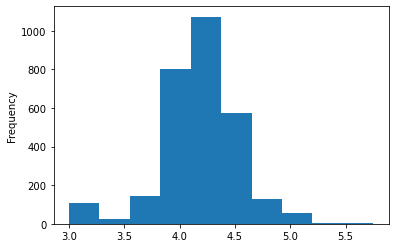

In [116]:
data_log1p_dummies_df[col].plot.hist()

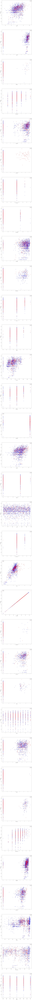

In [117]:
cols = np.intersect1d(data_log1p_thr_dummies_df.columns, data_df.columns)
i1 = 0
i2 = len(cols)
fig, axes = plt.subplots(len(cols[i1:i2]), 1, figsize=(15,15*(i2-i1)))
for i, c in enumerate(cols[i1:i2]):
    data_log1p_thr_dummies_train_df.get([c, col]).dropna().plot.scatter(x=c, y=col, ax=axes[i], rot=90, color='blue', label='train')
    data_log1p_null_dummies_df.get([c, col]).dropna().plot.scatter(x=c, y=col, ax=axes[i], rot=90, color='red', label='test')

# SalePrice predict

In [118]:
col = 'SalePrice'

In [119]:
data_log1p_dummies_sp_df = data_log1p_dummies_df.copy()
data_log1p_dummies_sp_df = pd.merge(data_log1p_dummies_sp_df, train_df.get(['Id', col]), how='left', on='Id')
data_log1p_dummies_sp_df[col] = np.log1p(data_log1p_dummies_sp_df[col])
data_log1p_dummies_sp_df.shape

(2919, 336)

In [120]:
data_log1p_dummies_sp_train_df = data_log1p_dummies_sp_df[data_df['Id'].isin(train_ids)]
data_log1p_dummies_sp_train_df.shape

(1460, 336)

In [121]:
data_log1p_dummies_sp_train_df.head()

,Id,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,...,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,SalePrice
0,1,4.189655,9.042040,7.602900,7.602900,5.283204,6.561031,0.0,5.017280,6.753438,...,0,0,1,0,0,0,0,1,0,12.247699
1,2,4.394449,9.169623,7.589336,7.589336,0.000000,6.886532,0.0,5.652489,7.141245,...,0,0,1,0,0,0,0,1,0,12.109016
2,3,4.234107,9.328212,7.601902,7.602401,5.093750,6.188264,0.0,6.075346,6.825460,...,0,0,1,0,0,0,0,1,0,12.317171
3,4,4.110874,9.164401,7.557995,7.586296,0.000000,5.379897,0.0,6.293419,6.629363,...,0,0,1,1,0,0,0,0,0,11.849405
4,5,4.442651,9.565284,7.601402,7.601402,5.860786,6.486161,0.0,6.196444,7.044033,...,0,0,1,0,0,0,0,1,0,12.429220


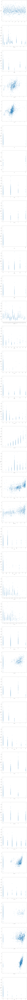

In [122]:
i1 = 0
i2 = int(len(train_df.columns) / 2)
# i2 = len(train_df.cumns)
fig, axes = plt.subplots(len(train_df.columns[i1:i2]), 1, figsize=(15,15*(i2-i1)))
for i, c in enumerate(train_df.columns[i1:i2]):
    if c in data_log1p_dummies_sp_train_df.columns:        
        data_log1p_dummies_sp_train_df.get([c, col]).dropna().plot.scatter(x=c, y=col, ax=axes[i], rot=90)
    else:
        train_df.get([c, col]).dropna().plot.scatter(x=c, y=col, ax=axes[i], rot=90)

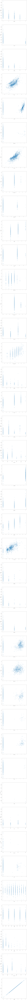

In [123]:
i1 = int(len(train_df.columns) / 2)
i2 = len(train_df.columns)
# i2 = len(train_df.columns)
fig, axes = plt.subplots(len(train_df.columns[i1:i2]), 1, figsize=(15,15*(i2-i1)))
for i, c in enumerate(train_df.columns[i1:i2]):
    if c in data_log1p_dummies_sp_train_df.columns:        
        data_log1p_dummies_sp_train_df.get([c, col]).dropna().plot.scatter(x=c, y=col, ax=axes[i], rot=90)
    else:
        train_df.get([c, col]).dropna().plot.scatter(x=c, y=col, ax=axes[i], rot=90)

##### Outliers

In [124]:
linear_cols = [
    'LotFrontage',
    'LotArea',
    'MasVnrArea',
    'BsmtFinSF1',
    'BsmtFinSF2',
    'BsmtUnfSF',
    'TotalBsmtSF',
    '1stFlrSF',
    '2ndFlrSF',
    'GrLivArea',
    'GarageArea',
    'WoodDeckSF',
    'OpenPorchSF'
]

In [125]:
linear_thresholds = dict()
for c in linear_cols + [col]:
    _, _, _, _, linear_thresholds[c] = score_outliers(data_log1p_dummies_sp_train_df[c].dropna())
linear_thresholds[col]

13.02168235497344

In [126]:
data_thr_df = data_log1p_dummies_sp_train_df.copy()
for c in linear_cols + [col]:
    data_thr_df = data_thr_df[data_thr_df[c] <= linear_thresholds[c]]
data_thr_df.shape

(1220, 336)

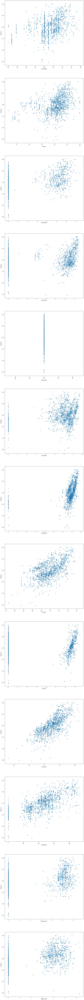

In [127]:
fig, axes = plt.subplots(len(linear_cols), 1, figsize=(15,15*len(linear_cols)))
for i, c in enumerate(linear_cols):
    data_thr_df.get([c, col]).dropna().plot.scatter(x=c, y=col, ax=axes[i], rot=90)

### Dummies

In [128]:
data_log1p_thr_dummies_sp_train_df = data_log1p_dummies_sp_train_df[data_log1p_dummies_sp_train_df['Id'].isin(data_thr_df['Id'])]
data_log1p_thr_dummies_sp_train_df.shape

(1220, 336)

In [129]:
data_log1p_thr_dummies_sp_train_df.head()

,Id,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,...,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,SalePrice
0,1,4.189655,9.042040,7.602900,7.602900,5.283204,6.561031,0.0,5.017280,6.753438,...,0,0,1,0,0,0,0,1,0,12.247699
1,2,4.394449,9.169623,7.589336,7.589336,0.000000,6.886532,0.0,5.652489,7.141245,...,0,0,1,0,0,0,0,1,0,12.109016
2,3,4.234107,9.328212,7.601902,7.602401,5.093750,6.188264,0.0,6.075346,6.825460,...,0,0,1,0,0,0,0,1,0,12.317171
3,4,4.110874,9.164401,7.557995,7.586296,0.000000,5.379897,0.0,6.293419,6.629363,...,0,0,1,1,0,0,0,0,0,11.849405
4,5,4.442651,9.565284,7.601402,7.601402,5.860786,6.486161,0.0,6.196444,7.044033,...,0,0,1,0,0,0,0,1,0,12.429220


### Regression

In [130]:
X = data_log1p_thr_dummies_sp_train_df.copy()
X.pop(col)
X.pop('Id')
y = data_log1p_thr_dummies_sp_train_df[col]
X.shape, y.shape

((1220, 334), (1220,))

In [131]:
X_train, X_validation, y_train, y_validation = train_test_split(X, y, train_size=0.75, random_state=42)
X_train.shape, X_validation.shape, y_train.shape, y_validation.shape

((915, 334), (305, 334), (915,), (305,))

##### Ridge

In [132]:
ridge_model = Pipeline(steps=[('robast', RobustScaler()), ('ridge', KernelRidge(kernel='polynomial'))])

In [133]:
param_grid = {
    'ridge__alpha': [1, 0.1, 0.01, 0.001],
    'ridge__degree': range(2, 6),
}

ridge_grid_search = GridSearchCV(ridge_model, param_grid=param_grid, scoring='neg_mean_squared_error')

In [134]:
ridge_grid_search.fit(X_train, y_train)

GridSearchCV(estimator=Pipeline(steps=[('robast', RobustScaler()),
                                       ('ridge',
                                        KernelRidge(kernel='polynomial'))]),
             param_grid={'ridge__alpha': [1, 0.1, 0.01, 0.001],
                         'ridge__degree': range(2, 6)},
             scoring='neg_mean_squared_error')

In [135]:
ridge_grid_search.best_params_

{'ridge__alpha': 0.1, 'ridge__degree': 2}

In [136]:
ridge_grid_search.best_score_

-0.019997543579229317

In [137]:
alpha = ridge_grid_search.best_params_['ridge__alpha']
degree = ridge_grid_search.best_params_['ridge__degree']

ridge_model = Pipeline(
    steps=[
        ('robast', RobustScaler()),
        ('ridge', KernelRidge(alpha=alpha, kernel='polynomial', degree=degree))
    ]
)
ridge_model

Pipeline(steps=[('robast', RobustScaler()),
                ('ridge',
                 KernelRidge(alpha=0.1, degree=2, kernel='polynomial'))])

##### Lasso

In [138]:
lasso_model = Pipeline(steps=[('robast', RobustScaler()), ('lasso', Lasso())])

In [139]:
param_grid = {
    'lasso__alpha': [1, 0.1, 0.01, 0.001],
}

lasso_grid_search = GridSearchCV(lasso_model, param_grid=param_grid, scoring='neg_mean_squared_error')

In [140]:
lasso_grid_search.fit(X_train, y_train)

GridSearchCV(estimator=Pipeline(steps=[('robast', RobustScaler()),
                                       ('lasso', Lasso())]),
             param_grid={'lasso__alpha': [1, 0.1, 0.01, 0.001]},
             scoring='neg_mean_squared_error')

In [141]:
lasso_grid_search.best_params_

{'lasso__alpha': 0.001}

In [142]:
lasso_grid_search.best_score_

-0.01441931121000635

In [143]:
alpha = lasso_grid_search.best_params_['lasso__alpha']

lasso_model = Pipeline(
    steps=[
        ('robast', RobustScaler()),
        ('lasso', Lasso(alpha=alpha))
    ]
)
lasso_model

Pipeline(steps=[('robast', RobustScaler()), ('lasso', Lasso(alpha=0.001))])

##### ElasticNet

In [144]:
enet_model = Pipeline(steps=[('robast', RobustScaler()), ('enet', ElasticNet())])

In [145]:
param_grid = {
    'enet__alpha': [1, 0.1, 0.01, 0.001],
    'enet__l1_ratio': [0.01, 0.1, 0.5, 0.75]
}

enet_grid_search = GridSearchCV(enet_model, param_grid=param_grid, scoring='neg_mean_squared_error')

In [146]:
enet_grid_search.fit(X_train, y_train)

GridSearchCV(estimator=Pipeline(steps=[('robast', RobustScaler()),
                                       ('enet', ElasticNet())]),
             param_grid={'enet__alpha': [1, 0.1, 0.01, 0.001],
                         'enet__l1_ratio': [0.01, 0.1, 0.5, 0.75]},
             scoring='neg_mean_squared_error')

In [147]:
enet_grid_search.best_params_

{'enet__alpha': 0.01, 'enet__l1_ratio': 0.01}

In [148]:
enet_grid_search.best_score_

-0.014050440090593141

In [149]:
alpha = enet_grid_search.best_params_['enet__alpha']
l1_ratio = enet_grid_search.best_params_['enet__l1_ratio']

enet_model = Pipeline(
    steps=[
        ('robast', RobustScaler()),
        ('enet', ElasticNet(alpha=alpha, l1_ratio=l1_ratio))
    ]
)
enet_model

Pipeline(steps=[('robast', RobustScaler()),
                ('enet', ElasticNet(alpha=0.01, l1_ratio=0.01))])

##### Random Forest

In [150]:
max_depth = 5
n_estimators = 5000

rf_model = Pipeline(
    steps=[
        ('robast', RobustScaler()),
        ('rf', RandomForestRegressor(max_depth=max_depth, n_estimators=n_estimators))
    ]
)
rf_model

Pipeline(steps=[('robast', RobustScaler()),
                ('rf', RandomForestRegressor(max_depth=5, n_estimators=5000))])

##### GradientBoostingRegressor

In [151]:
learning_rate=0.01
max_depth=5
n_estimators=5000


gbr_model = Pipeline(
    steps=[
        ('robast', RobustScaler()),
        ('gbr', GradientBoostingRegressor(
            loss='huber',
            learning_rate=learning_rate, 
            max_depth=max_depth, 
            n_estimators=n_estimators)
        )
    ]
)
gbr_model

Pipeline(steps=[('robast', RobustScaler()),
                ('gbr',
                 GradientBoostingRegressor(learning_rate=0.01, loss='huber',
                                           max_depth=5, n_estimators=5000))])

##### XGBoost

In [152]:
xgb_model = xgb.XGBRegressor(
    eval_metrics='rmse', n_estimators=5000, max_depth=5, eta=0.1, gamma=0.0,
    verbosity=0
)
xgb_model

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eta=0.1, eval_metric=None,
             eval_metrics='rmse', feature_types=None, gamma=0.0, gpu_id=None,
             grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=5000, n_jobs=None, num_parallel_tree=None, ...)

##### Models statistics

In [153]:
models = {
    'Ridge': ridge_model,
    'Lasso': lasso_model,
    'Elastic Net': enet_model,
    'Random Forest': rf_model,
    'Gradient Boosting Regressor': gbr_model,
    'XGBoost': xgb_model
}

In [154]:
models_cv_stat(models, X, y, n_cv=5)

,model,cv_score_mean,cv_score_std,rmsle_cv_score_mean,rmsle_cv_score_std
0,Ridge,0.893455,0.013430,0.015633,0.001115
1,Lasso,0.910889,0.013441,0.013077,0.001348
2,Elastic Net,0.911580,0.012375,0.012974,0.001125
3,Random Forest,0.831583,0.018591,0.024743,0.001064
4,Gradient Boosting Regressor,0.894529,0.015698,0.015557,0.001819
5,XGBoost,0.896211,0.010981,0.015234,0.000359


In [155]:
prep_models = dict()
for m_name, m in models.items():
    prep_models[m_name] = clone(m)
    if m_name == 'XGBoost':
        prep_models[m_name].fit(
            X_train, y_train,
            eval_set=[(X_train, y_train), (X_validation, y_validation)],
            early_stopping_rounds=100,
            verbose=True
        )
    else:
        prep_models[m_name].fit(X_train, y_train)

[0]	validation_0-rmse:10.35945	validation_1-rmse:10.36302
[1]	validation_0-rmse:9.32622	validation_1-rmse:9.32966
[2]	validation_0-rmse:8.39636	validation_1-rmse:8.39967
[3]	validation_0-rmse:7.55959	validation_1-rmse:7.56274
[4]	validation_0-rmse:6.80651	validation_1-rmse:6.80810
[5]	validation_0-rmse:6.12871	validation_1-rmse:6.12889
[6]	validation_0-rmse:5.51860	validation_1-rmse:5.51752
[7]	validation_0-rmse:4.96951	validation_1-rmse:4.96720
[8]	validation_0-rmse:4.47530	validation_1-rmse:4.47187
[9]	validation_0-rmse:4.03057	validation_1-rmse:4.02826
[10]	validation_0-rmse:3.63031	validation_1-rmse:3.62752
[11]	validation_0-rmse:3.27012	validation_1-rmse:3.26974
[12]	validation_0-rmse:2.94604	validation_1-rmse:2.94464
[13]	validation_0-rmse:2.65429	validation_1-rmse:2.65224
[14]	validation_0-rmse:2.39178	validation_1-rmse:2.39086
[15]	validation_0-rmse:2.15552	validation_1-rmse:2.15395
[16]	validation_0-rmse:1.94292	validation_1-rmse:1.94214
[17]	validation_0-rmse:1.75153	validati

[144]	validation_0-rmse:0.03972	validation_1-rmse:0.11803
[145]	validation_0-rmse:0.03944	validation_1-rmse:0.11799
[146]	validation_0-rmse:0.03921	validation_1-rmse:0.11811
[147]	validation_0-rmse:0.03893	validation_1-rmse:0.11802
[148]	validation_0-rmse:0.03879	validation_1-rmse:0.11806
[149]	validation_0-rmse:0.03855	validation_1-rmse:0.11795
[150]	validation_0-rmse:0.03838	validation_1-rmse:0.11796
[151]	validation_0-rmse:0.03817	validation_1-rmse:0.11798
[152]	validation_0-rmse:0.03785	validation_1-rmse:0.11795
[153]	validation_0-rmse:0.03774	validation_1-rmse:0.11790
[154]	validation_0-rmse:0.03763	validation_1-rmse:0.11788
[155]	validation_0-rmse:0.03748	validation_1-rmse:0.11783
[156]	validation_0-rmse:0.03738	validation_1-rmse:0.11788
[157]	validation_0-rmse:0.03717	validation_1-rmse:0.11787
[158]	validation_0-rmse:0.03698	validation_1-rmse:0.11780
[159]	validation_0-rmse:0.03671	validation_1-rmse:0.11785
[160]	validation_0-rmse:0.03652	validation_1-rmse:0.11787
[161]	validati

In [156]:
models_pred_stat(prep_models, X_train, y_train, X_validation, y_validation)

,model,rmse_train,rmse_test
0,Ridge,0.080302,0.120106
1,Lasso,0.101100,0.107276
2,Elastic Net,0.094374,0.106461
3,Random Forest,0.120905,0.151550
4,Gradient Boosting Regressor,0.011550,0.124726
5,XGBoost,0.036975,0.117802


##### VotingRegressor

In [157]:
vr_model = VotingRegressor(estimators=[(m_name, m) for m_name, m in models.items()])

In [158]:
models_cv_stat({'Voting': vr_model}, X, y, n_cv=5)

,model,cv_score_mean,cv_score_std,rmsle_cv_score_mean,rmsle_cv_score_std
0,Voting,0.911503,0.010988,0.012997,0.000879


In [159]:
prep_vr_model = clone(vr_model)
prep_vr_model.fit(X_train, y_train)

VotingRegressor(estimators=[('Ridge',
                             Pipeline(steps=[('robast', RobustScaler()),
                                             ('ridge',
                                              KernelRidge(alpha=0.1, degree=2,
                                                          kernel='polynomial'))])),
                            ('Lasso',
                             Pipeline(steps=[('robast', RobustScaler()),
                                             ('lasso', Lasso(alpha=0.001))])),
                            ('Elastic Net',
                             Pipeline(steps=[('robast', RobustScaler()),
                                             ('enet',
                                              ElasticNet(alpha=0.01,
                                                         l1_ratio=0.01))])),
                            ('Random Forest',
                             Pi...
                                          feature_types=None, gamma=0.0,
                                          gpu_id=None, grow_policy=None,
                                          importance_type=None,
                                          interaction_constraints=None,
                                          learning_rate=None, max_bin=None,
                                          max_cat_threshold=None,
                                          max_cat_to_onehot=None,
                                          max_delta_step=None, max_depth=5,
                                          max_leaves=None,
                                          min_child_weight=None, missing=nan,
                                          monotone_constraints=None,
                                          n_estimators=5000, n_jobs=None,
                                          num_parallel_tree=None, ...))])

In [160]:
models_pred_stat({'Voting': prep_vr_model}, X_train, y_train, X_validation, y_validation)

,model,rmse_train,rmse_test
0,Voting,0.06068,0.108517


##### Predicting

In [161]:
prep_vr_model = clone(vr_model)
prep_vr_model.fit(X, y)

VotingRegressor(estimators=[('Ridge',
                             Pipeline(steps=[('robast', RobustScaler()),
                                             ('ridge',
                                              KernelRidge(alpha=0.1, degree=2,
                                                          kernel='polynomial'))])),
                            ('Lasso',
                             Pipeline(steps=[('robast', RobustScaler()),
                                             ('lasso', Lasso(alpha=0.001))])),
                            ('Elastic Net',
                             Pipeline(steps=[('robast', RobustScaler()),
                                             ('enet',
                                              ElasticNet(alpha=0.01,
                                                         l1_ratio=0.01))])),
                            ('Random Forest',
                             Pi...
                                          feature_types=None, gamma=0.0,
                                          gpu_id=None, grow_policy=None,
                                          importance_type=None,
                                          interaction_constraints=None,
                                          learning_rate=None, max_bin=None,
                                          max_cat_threshold=None,
                                          max_cat_to_onehot=None,
                                          max_delta_step=None, max_depth=5,
                                          max_leaves=None,
                                          min_child_weight=None, missing=nan,
                                          monotone_constraints=None,
                                          n_estimators=5000, n_jobs=None,
                                          num_parallel_tree=None, ...))])

In [162]:
data_log1p_dummies_sp_test_df = data_log1p_dummies_sp_df[data_log1p_dummies_sp_df[col].isnull()]
data_log1p_dummies_sp_test_df.shape

(1459, 336)

In [163]:
data_log1p_dummies_sp_test_df.head()

,Id,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,...,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,SalePrice
1460,1461,4.394449,9.360741,7.581720,7.581720,0.000000,6.150603,4.976734,5.602119,6.783325,...,0,0,1,0,0,0,0,1,0,NaN
1461,1462,4.406719,9.565775,7.580189,7.580189,4.691348,6.828712,0.000000,6.008813,7.192934,...,0,0,1,0,0,0,0,1,0,NaN
1462,1463,4.317488,9.534668,7.599902,7.600402,0.000000,6.674561,0.000000,4.927254,6.834109,...,0,0,1,0,0,0,0,1,0,NaN
1463,1464,4.369448,9.208238,7.600402,7.600402,3.044522,6.401917,0.000000,5.783825,6.831954,...,0,0,1,0,0,0,0,1,0,NaN
1464,1465,3.784190,8.518392,7.597396,7.597396,0.000000,5.575949,0.000000,6.925595,7.155396,...,0,0,1,0,0,0,0,1,0,NaN


In [164]:
X_test = data_log1p_dummies_sp_test_df.copy()
X_test.pop(col)
X_test.pop('Id')
y_test = data_log1p_dummies_sp_test_df[col]
X_test.shape, y_test.shape

((1459, 334), (1459,))

In [165]:
y_pred = prep_vr_model.predict(X_test)

In [166]:
y_pred[:10]

array([11.72247723, 11.94526566, 12.18024624, 12.19581214, 12.15953226,
       12.09033056, 12.07600896, 12.02900399, 12.14675302, 11.73317664])

In [167]:
y_expm1_pred = np.expm1(y_pred)
y_expm1_pred[:10]

array([123311.52044708, 154084.92113852, 194899.84931819, 197957.38997867,
       190904.20159238, 178139.98342505, 175606.90177071, 167543.45288882,
       188480.10176647, 124637.97542352])

In [168]:
data_log1p_dummies_sp_test_df[col] = y_pred

In [169]:
ind_cols = data_log1p_dummies_sp_test_df.get([col]).to_dict()[col]
len(ind_cols)

1459

In [170]:
for ind, v in ind_cols.items():
    data_log1p_dummies_sp_df.at[ind, col] = round(v)

In [171]:
data_log1p_dummies_sp_df.isnull().sum()[col]

0

<AxesSubplot:ylabel='Frequency'>

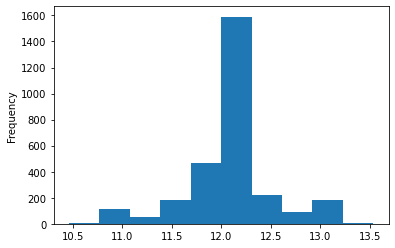

In [172]:
data_log1p_dummies_sp_df[col].plot.hist()

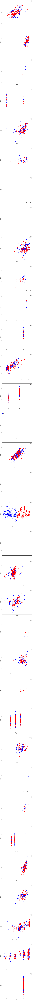

In [173]:
cols = np.intersect1d(data_log1p_dummies_sp_df.columns, data_df.columns)
i1 = 0
i2 = len(cols)
fig, axes = plt.subplots(len(cols[i1:i2]), 1, figsize=(15,15*(i2-i1)))
for i, c in enumerate(cols[i1:i2]):
    data_log1p_dummies_sp_train_df.get([c, col]).dropna().plot.scatter(x=c, y=col, ax=axes[i], rot=90, color='blue', label='train')
    data_log1p_dummies_sp_test_df.get([c, col]).dropna().plot.scatter(x=c, y=col, ax=axes[i], rot=90, color='red', label='test')

### Submission

In [174]:
submission_df = data_log1p_dummies_sp_test_df.get(['Id', col])
submission_df.shape

(1459, 2)

In [175]:
submission_df[col] = np.expm1(submission_df[col])

In [176]:
submission_df.head()

,Id,SalePrice
1460,1461,123311.520447
1461,1462,154084.921139
1462,1463,194899.849318
1463,1464,197957.389979
1464,1465,190904.201592


In [177]:
submission_df.to_csv('./submission.csv', sep=',', index=False)